# Import Libraries

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.model_selection import train_test_split
import pickle

import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot, plot


import warnings
warnings.filterwarnings("ignore")

# Data Load

In [2]:
dataset = pd.read_csv("processed.cleveland.csv", na_values=['?'])

In [3]:
dataset.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


In [4]:
dataset.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,299.000000,301.000000,303.000000
mean,54.438944,0.679868,3.158416,131.689769,246.693069,0.148515,0.990099,149.607261,0.326733,1.039604,1.600660,0.672241,4.734219,0.937294
std,9.038662,0.467299,0.960126,17.599748,51.776918,0.356198,0.994971,22.875003,0.469794,1.161075,0.616226,0.937438,1.939706,1.228536
min,29.000000,0.000000,1.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
25%,48.000000,0.000000,3.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
50%,56.000000,1.000000,3.000000,130.000000,241.000000,0.000000,1.000000,153.000000,0.000000,0.800000,2.000000,0.000000,3.000000,0.000000
75%,61.000000,1.000000,4.000000,140.000000,275.000000,0.000000,2.000000,166.000000,1.000000,1.600000,2.000000,1.000000,7.000000,2.000000
max,77.000000,1.000000,4.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,3.000000,7.000000,4.000000


In [5]:
dataset.columns

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    float64
 1   sex       303 non-null    float64
 2   cp        303 non-null    float64
 3   trestbps  303 non-null    float64
 4   chol      303 non-null    float64
 5   fbs       303 non-null    float64
 6   restecg   303 non-null    float64
 7   thalach   303 non-null    float64
 8   exang     303 non-null    float64
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    float64
 11  ca        299 non-null    float64
 12  thal      301 non-null    float64
 13  target    303 non-null    int64  
dtypes: float64(13), int64(1)
memory usage: 33.3 KB


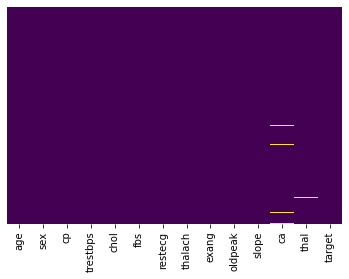

In [7]:
sns.heatmap(dataset.isnull(),yticklabels=False,cbar=False,cmap='viridis')
#  'viridis', 'plasma', 'inferno', 'magma', 'cividis'

In [8]:
dataset.isna().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          4
thal        2
target      0
dtype: int64

In [9]:
dataset.isnull().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          4
thal        2
target      0
dtype: int64

# Exploratory Data Analysis

## Feature Correlation 

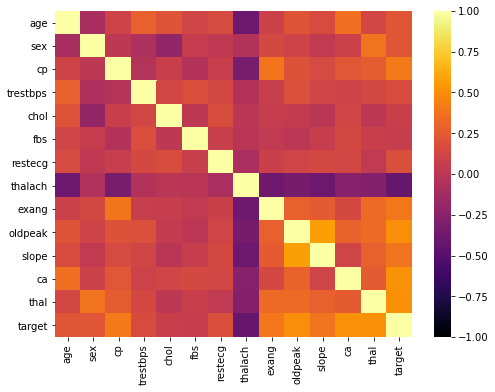

In [10]:
plt.figure(figsize=(8,6))
sns.heatmap(dataset.corr(),vmin=-1,cmap='inferno')

## Target Distribution 

In [11]:
fig = px.histogram(dataset, x="target", marginal="violin", hover_data=dataset.columns,
                   title ="Target", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [12]:
dataset['target'] = dataset.target.map({0: 0, 1: 1, 2: 1, 3: 1, 4: 1})

In [13]:
labels = dataset['target'].value_counts().index
pie1 = dataset['target'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Target",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "Target",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [14]:
fig = px.histogram(dataset, x="target", marginal="violin", hover_data=dataset.columns,
                   title ="Target", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Sex Distribution

In [15]:
dataset['sex'] = dataset.sex.map({0: 'Female', 1: 'Male'})

labels = dataset['sex'].value_counts().index
pie1 = dataset['sex'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Sex",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "SEX",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [16]:
fig = px.histogram(dataset, x="sex", marginal="violin", hover_data=dataset.columns,
                   title ="Gender", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [17]:
fig = px.histogram(dataset, x="sex", color="target", marginal="violin", hover_data=dataset.columns,
                   title ="Gender vs Target", 
                   template="plotly_dark",
                   color_discrete_map={"0": "RebeccaPurple", "1": "MediumPurple"},
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05)
fig.show()

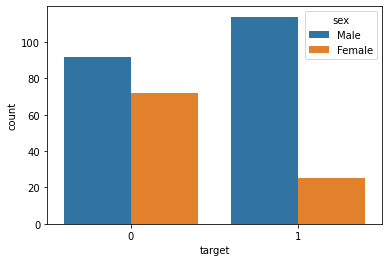

In [18]:
sns.countplot(x='target',hue='sex',data=dataset)

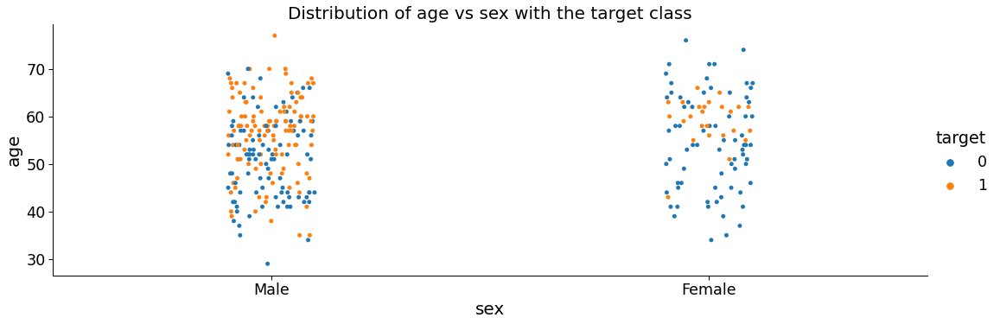

In [19]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'age', x = 'sex', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

## Age Distribusion 

In [20]:
bins= [0,33,40,52,max(dataset.age)]
labels = ['Young','Medium','Old','Very Old']
dataset['AgeGroup'] = pd.cut(dataset['age'], bins=bins, labels=labels, right=False)

labels = dataset['AgeGroup'].value_counts().index
pie1 = dataset['AgeGroup'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Age Group",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "Age",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

Text(0.5, 1.0, 'the ages of our persone')

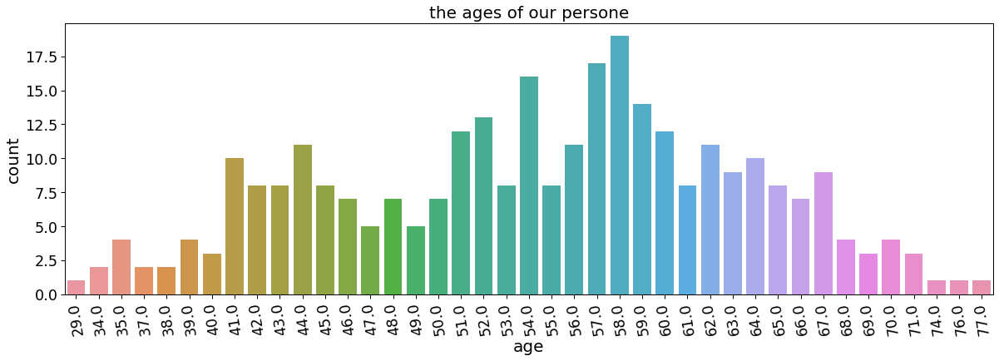

In [21]:
plt.figure(figsize=(20,6))
sns.countplot(x='age', data=dataset)
plt.xticks(rotation=99)
plt.title("the ages of our persone")

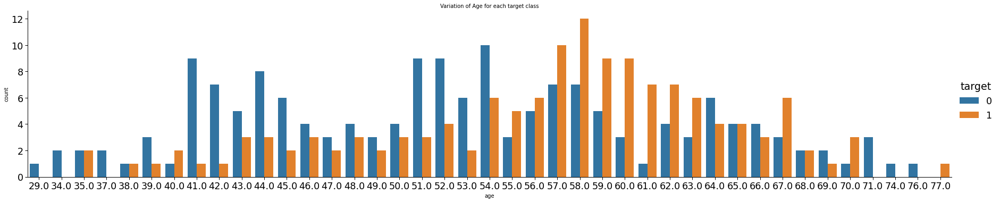

In [22]:
# distribution of target vs age 
sns.set_context("paper", font_scale = 2, rc = {"font.size": 10,"axes.titlesize": 10,"axes.labelsize": 10}) 
sns.catplot(kind = 'count', data = dataset, x = 'age', hue = 'target', order = dataset['age'].sort_values().unique(), aspect=5)
plt.title('Variation of Age for each target class')
plt.show()

In [23]:
fig = px.histogram(dataset, x="age", marginal="violin", hover_data=dataset.columns,
                   title ="Age", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [24]:
fig = px.histogram(dataset, x="age", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Age", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [25]:
fig = px.histogram(dataset, x="age", color='sex', marginal="violin", hover_data=dataset.columns,
                   title ="Age", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Chest Pain Type Distribution

In [26]:
dataset['cp'] = dataset.cp.map({1: 'Typical Angina', 2: 'Atypical Angina', 3: 'Non-angina Pain', 4: 'Asymptomatic'})

labels = dataset['cp'].value_counts().index
pie1 = dataset['cp'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Chest Pain Type",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "CPT",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [27]:
fig = px.histogram(dataset, x="cp", marginal="violin", hover_data=dataset.columns,
                   title ="Chest Pain", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [28]:
fig = px.histogram(dataset, x="cp", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Chest Pain", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Resting Blood Pressure Distribution

In [29]:
bins= [0,128,142,154,max(dataset.trestbps)]
labels = ['Low','Medium','High','Very High']

dataset['rbpgroup'] = pd.cut(dataset['trestbps'], bins=bins, labels=labels, right=False)

labels = dataset['rbpgroup'].value_counts().index
pie1 = dataset['rbpgroup'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Resting Blood Pressure",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "RBP",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [30]:
fig = px.histogram(dataset, x="trestbps", marginal="violin", hover_data=dataset.columns,
                   title ="Resting Blood Pressure", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [31]:
fig = px.histogram(dataset, x="trestbps", color="target", marginal="violin", hover_data=dataset.columns,
                   title ="Resting Blood Pressure", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Serum Cholesterol Distribution

In [32]:
bins= [0,188,217,281,max(dataset.chol)]
labels = ['Low','Medium','High','Very High']

dataset['schgroup'] = pd.cut(dataset['chol'], bins=bins, labels=labels, right=False)

labels = dataset['schgroup'].value_counts().index
pie1 = dataset['schgroup'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Serum Cholesterol",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "Serum Cholesterol",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [33]:
fig = px.histogram(dataset, x="chol", marginal="violin", hover_data=dataset.columns,
                   title ="Serum Cholestrol", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [34]:
fig = px.histogram(dataset, x="chol", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Serum Cholestrol", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Fasting Blood Sugar Distribution

In [35]:
dataset['fbs'] = dataset.fbs.map({0: 'NO', 1: 'YES'})

labels = dataset['fbs'].value_counts().index
pie1 = dataset['fbs'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Fasting Blood Sugar",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "FBS",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [36]:
fig = px.histogram(dataset, x="fbs", marginal="violin", hover_data=dataset.columns,
                   title ="Fasting Blood Sugar", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [37]:
fig = px.histogram(dataset, x="fbs", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Fasting Blood Sugar", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Resting Electrocardiographic Results Distribution

In [38]:
dataset['restecg'] = dataset.restecg.map({0: 'Normal', 1: 'ST-T Abnormal', 2: 'Hypertrophy'})

labels = dataset['restecg'].value_counts().index
pie1 = dataset['restecg'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Resting Electrocardiographic Results",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "RES",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [39]:
fig = px.histogram(dataset, x="restecg", marginal="violin", hover_data=dataset.columns,
                   title ="Resting Electrocardiographic", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [40]:
fig = px.histogram(dataset, x="restecg", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Resting Electrocardiographic", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Maximum Heart Rate Achieved Distribution

In [41]:
bins= [0,112,152,max(dataset.thalach)]
labels = ['Low','Medium','High']

dataset['mhrgroup'] = pd.cut(dataset['thalach'], bins=bins, labels=labels, right=False)

labels = dataset['mhrgroup'].value_counts().index
pie1 = dataset['mhrgroup'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Maximum Heart Rate Achieved",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "MHR",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [42]:
fig = px.histogram(dataset, x="thalach", marginal="violin", hover_data=dataset.columns,
                   title ="Maximum Heart Rate", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [43]:
fig = px.histogram(dataset, x="thalach", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Maximum Heart Rate", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [44]:
fig = px.histogram(dataset, x="mhrgroup", marginal="violin", hover_data=dataset.columns,
                   title ="Maximum Heart Rate", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [45]:
fig = px.histogram(dataset, x="mhrgroup", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Maximum Heart Rate", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Exercise Induced Angina Distribution

In [46]:
dataset['exang'] = dataset.exang.map({0: 'False', 1: 'True'})

labels = dataset['exang'].value_counts().index
pie1 = dataset['exang'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Exercise Induced Angina",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "EIA",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [47]:
fig = px.histogram(dataset, x="exang", marginal="violin", hover_data=dataset.columns,
                   title ="Exercise Induced Angina", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [48]:
fig = px.histogram(dataset, x="exang", color="target", marginal="violin", hover_data=dataset.columns,
                   title ="Exercise Induced Angina", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Old Peak Distribution

In [49]:
bins= [0,1.5,2.55,max(dataset.oldpeak)]
labels = ['Low','Risk','Terrible']

dataset['opgroup'] = pd.cut(dataset['oldpeak'], bins=bins, labels=labels, right=False)

labels = dataset['opgroup'].value_counts().index
pie1 = dataset['opgroup'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Old peak",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "Old peak",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [50]:
fig = px.histogram(dataset, x="oldpeak", marginal="violin", hover_data=dataset.columns,
                   title ="Old Peak", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [51]:
fig = px.histogram(dataset, x="oldpeak", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Old Peak", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [52]:
fig = px.histogram(dataset, x="opgroup", marginal="violin", hover_data=dataset.columns,
                   title ="Old Peak", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [53]:
fig = px.histogram(dataset, x="opgroup", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Old Peak", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Peak Exercise Slope Distribution

In [54]:
dataset['slope'] = dataset.slope.map({1: 'Upsloping', 2: 'Flat', 3: 'Downsloping'})

labels = dataset['slope'].value_counts().index
pie1 = dataset['slope'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Peak Exercise Slope",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "PES",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [55]:
fig = px.histogram(dataset, x="slope", marginal="violin", hover_data=dataset.columns,
                   title ="Peak Exercise Slope", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [56]:
fig = px.histogram(dataset, x="slope", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Peak Exercise Slope", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Number of Major Vessels Colored by Fluoroscopy Distribution

In [57]:
dataset['ca'] = dataset.ca.map({0: 'Fluoroscopy-0', 1: 'Fluoroscopy-1', 2: 'Fluoroscopy-2', 3: 'Fluoroscopy-3'})

labels = dataset['ca'].value_counts().index
pie1 = dataset['ca'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Number of Major Vessels Colored by Fluoroscopy",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "MVCF",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [58]:
fig = px.histogram(dataset, x="ca", marginal="violin", hover_data=dataset.columns,
                   title ="Number of Major Vessel", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [59]:
fig = px.histogram(dataset, x="ca", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Number of Major Vessel", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Thallium Scan Distribution

In [60]:
dataset['thal'] = dataset.thal.map({3: 'Normal', 6: 'Fixed Defect', 7: 'Reversible Defect'})

labels = dataset['thal'].value_counts().index
pie1 = dataset['thal'].value_counts().values
# figure
fig = {
  "data": [
    {
      "values": pie1,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "",
      "hoverinfo":"label+percent+name+value",
      "hole": .2,
      "type": "pie"
    },],
  "layout": {
        "title":"Distribution of Thallium Scan",
        "annotations": [
            { "font": { "size": 25},
              "showarrow": True,
              "text": "Thallium Scan",
                "x": 1,
                "y": 1,
            },
        ]
    }
}
iplot(fig)

In [61]:
fig = px.histogram(dataset, x="thal", marginal="violin", hover_data=dataset.columns,
                   title ="Thallium Scan", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

In [62]:
fig = px.histogram(dataset, x="thal", color='target', marginal="violin", hover_data=dataset.columns,
                   title ="Thallium Scan", 
                   template="plotly_dark",
                   opacity=0.8)
fig.update_layout(
        width=700,height=600,
        yaxis_title_text='count',
        bargap=0.05,
        )
fig.show()

## Combinational Features

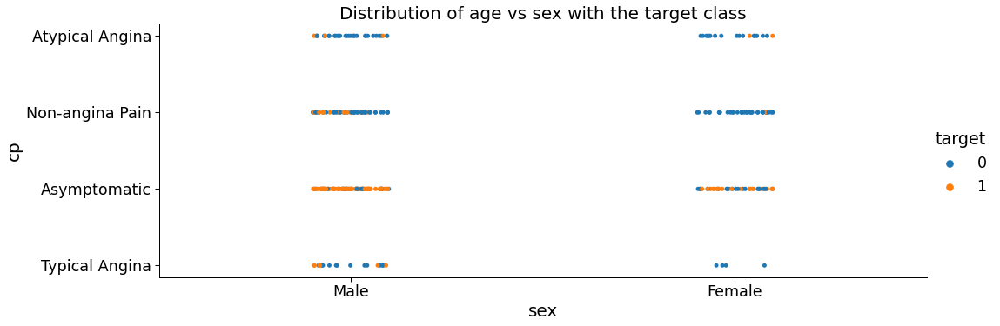

In [63]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'cp', x = 'sex', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

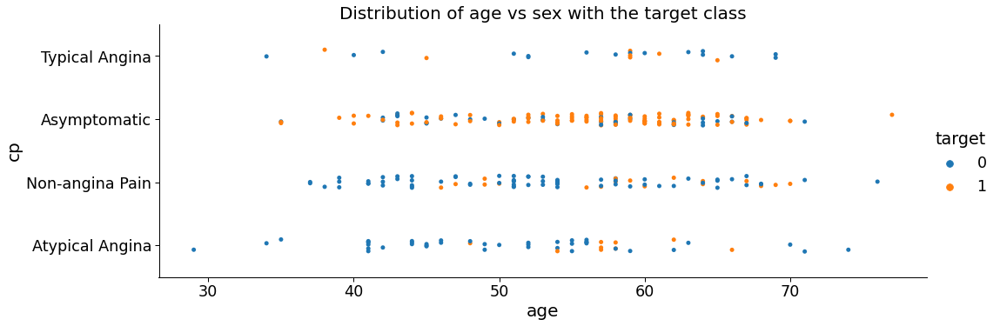

In [64]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'cp', x = 'age', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

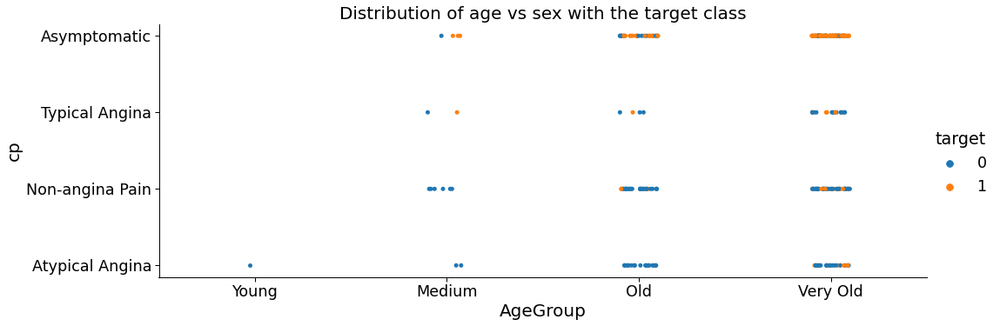

In [65]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'cp', x = 'AgeGroup', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

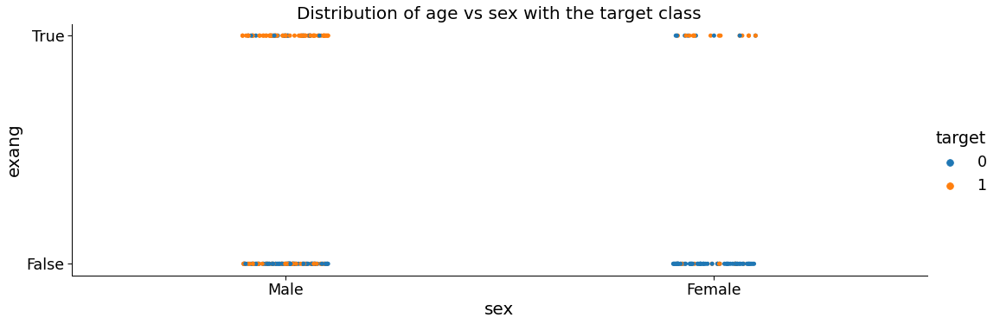

In [66]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'exang', x = 'sex', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

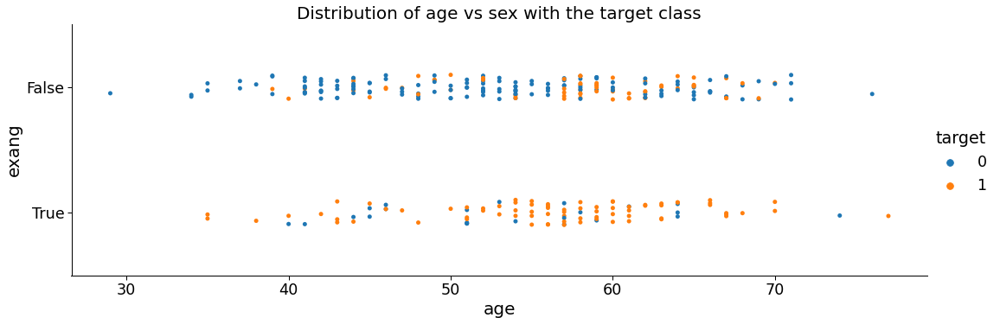

In [67]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'exang', x = 'age', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

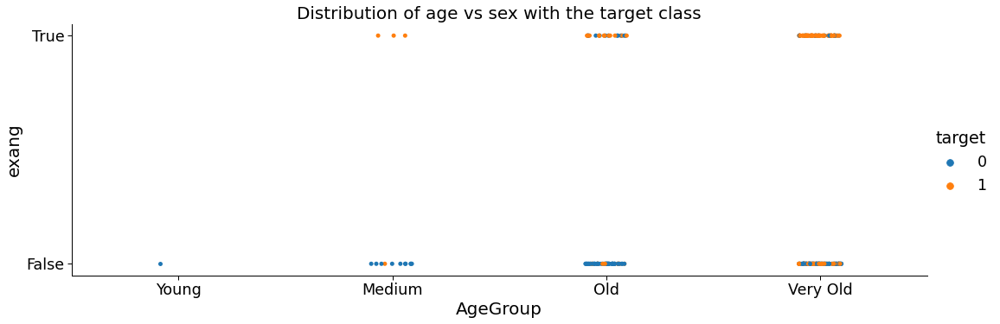

In [68]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'exang', x = 'AgeGroup', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

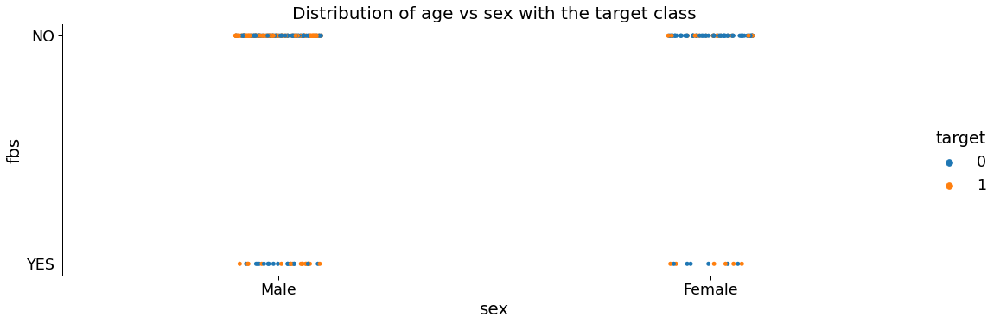

In [69]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'fbs', x = 'sex', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

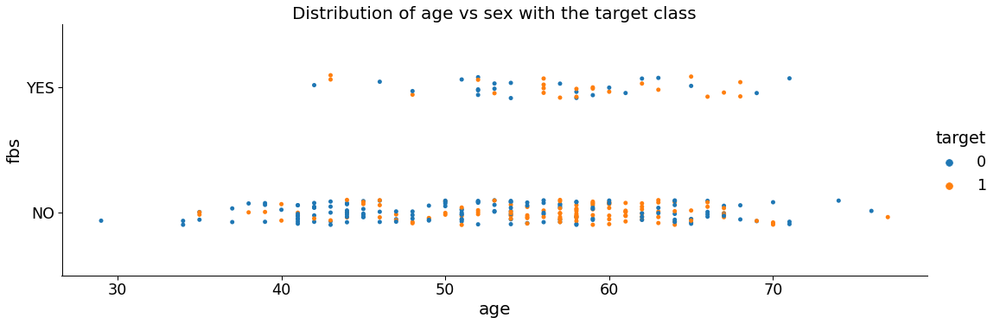

In [70]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'fbs', x = 'age', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

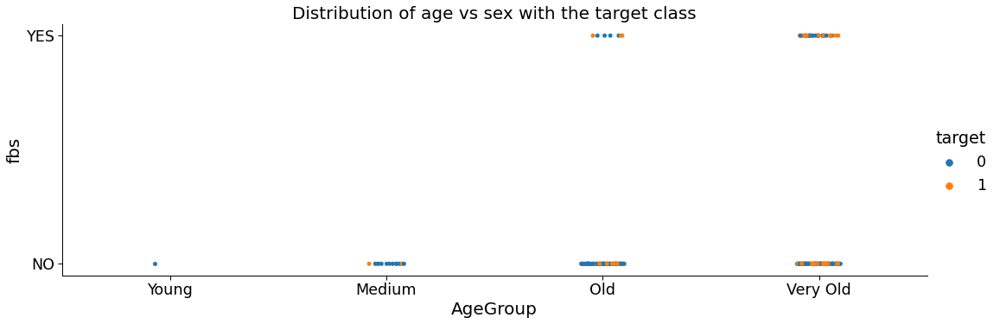

In [71]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'fbs', x = 'AgeGroup', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

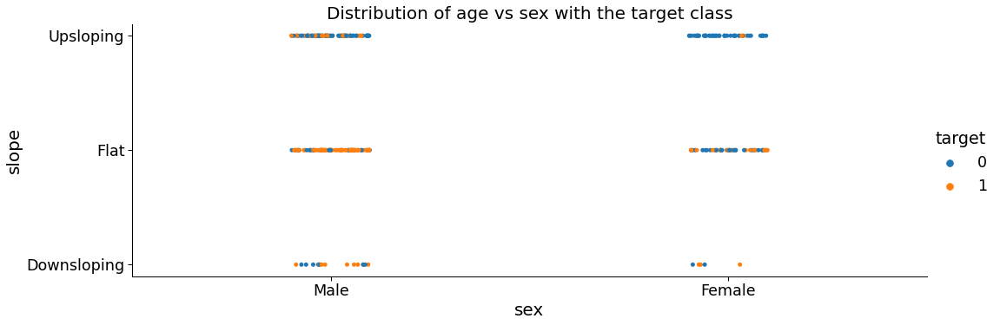

In [72]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'slope', x = 'sex', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

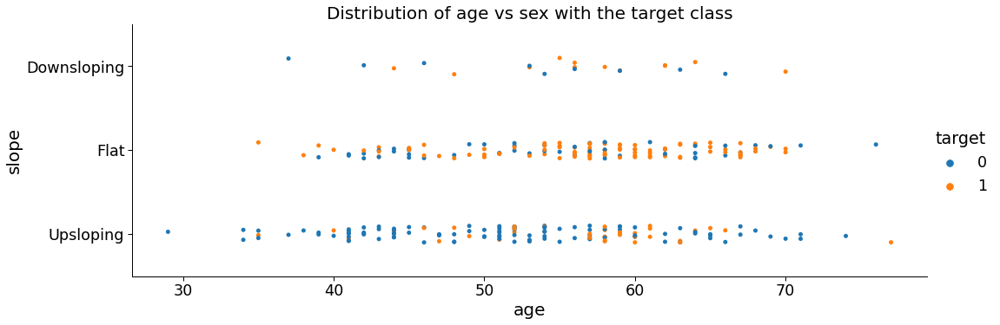

In [73]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'slope', x = 'age', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

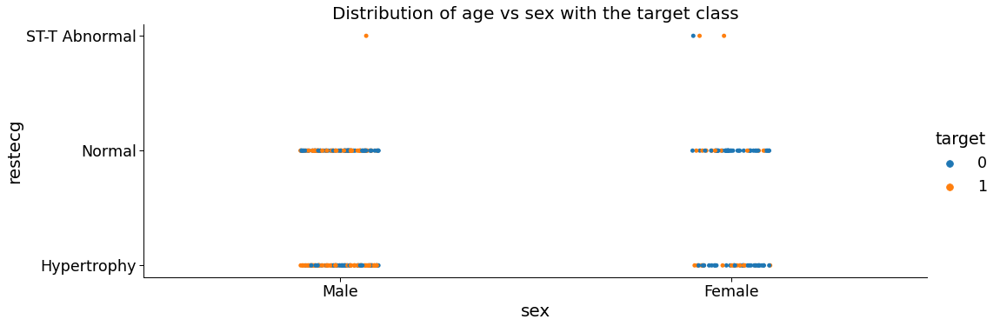

In [74]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'restecg', x = 'sex', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

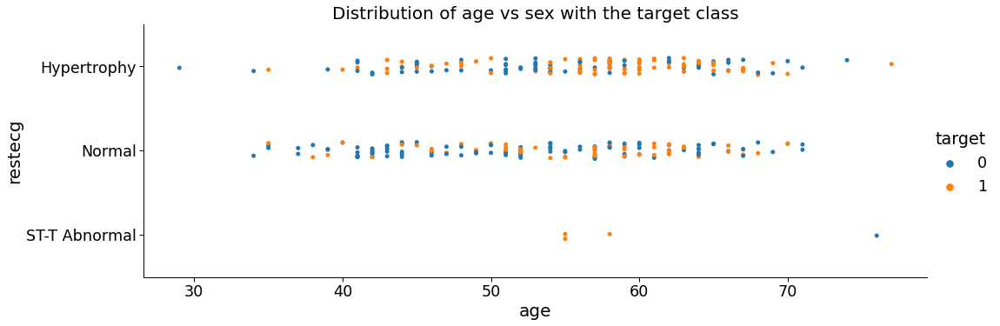

In [75]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'restecg', x = 'age', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

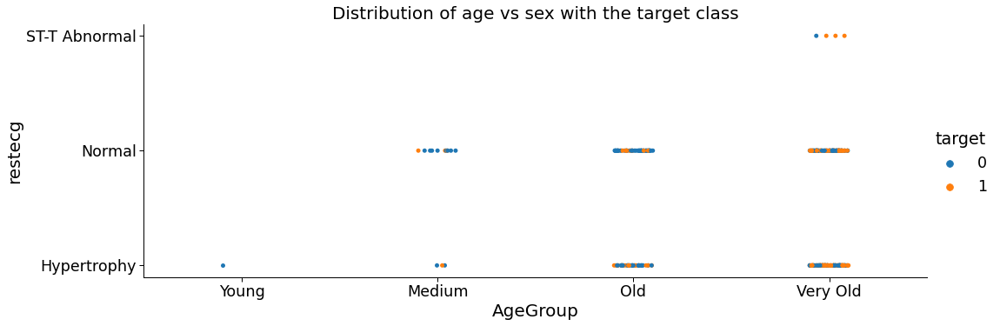

In [76]:
# barplot of age vs sex with hue = target
sns.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 20,"axes.labelsize": 20}) 
sns.catplot(data = dataset, y = 'restecg', x = 'AgeGroup', hue = 'target', aspect=3)
plt.title('Distribution of age vs sex with the target class')
plt.show()

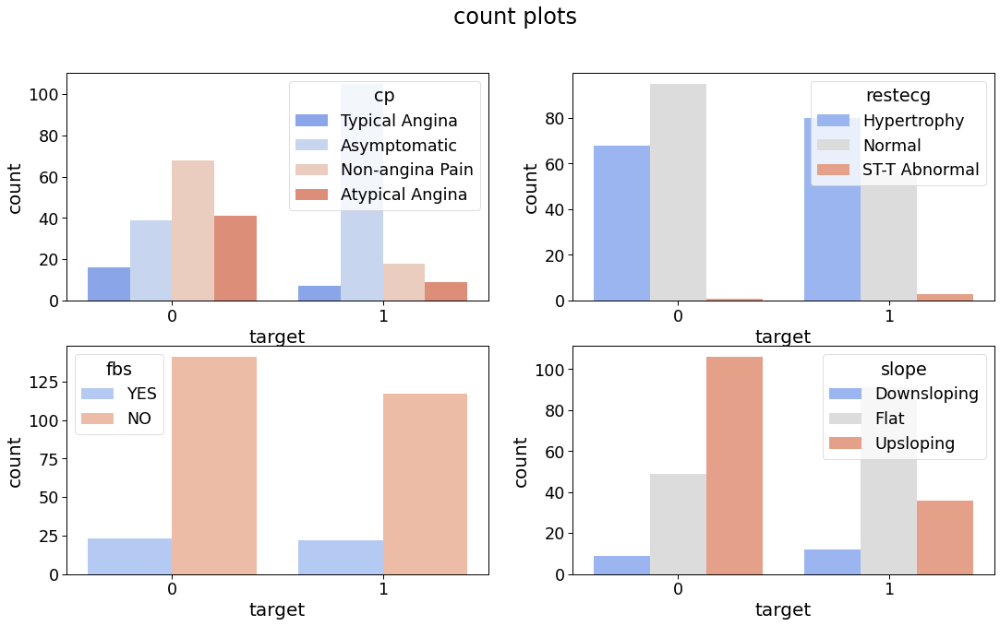

In [77]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

fig.suptitle('count plots')

sns.countplot(ax=axes[0, 0],x='target',hue='cp',data=dataset,palette='coolwarm')# should stay
sns.countplot(ax=axes[0, 1],x='target',hue='restecg',data=dataset,palette='coolwarm')# can be removed
sns.countplot(ax=axes[1, 0],x='target',hue='fbs',data=dataset,palette='coolwarm')# should stay
sns.countplot(ax=axes[1, 1],x='target',hue='slope',data=dataset,palette='coolwarm') #can be removed



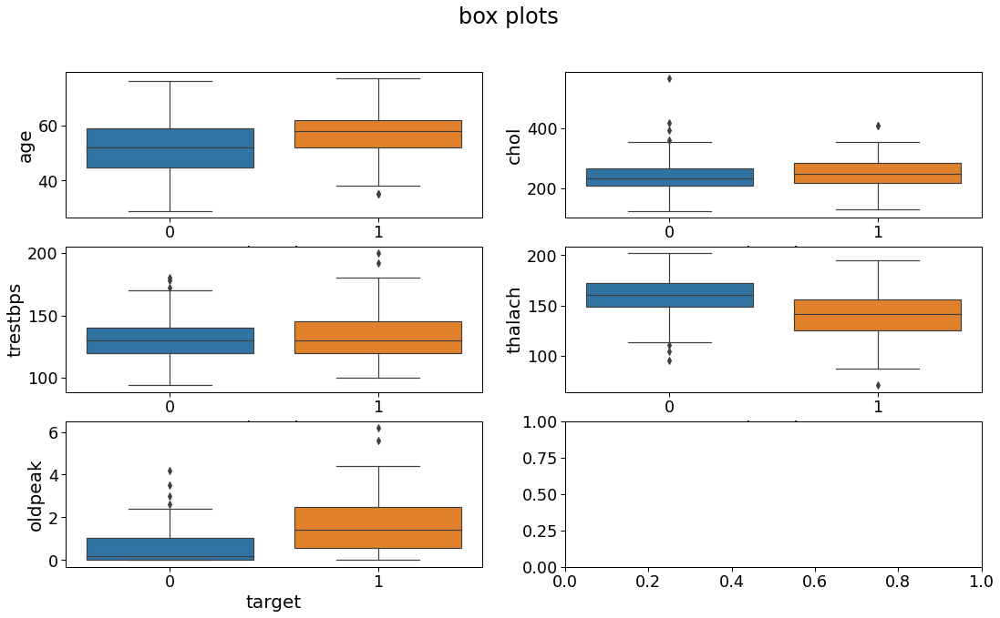

In [78]:
fig, axes = plt.subplots(3, 2, figsize=(18, 10))

fig.suptitle('box plots')

sns.boxplot(ax=axes[0, 0],x='target',y='age',data=dataset)
sns.boxplot(ax=axes[0, 1],x='target',y='chol',data=dataset)
sns.boxplot(ax=axes[1, 0],x='target',y='trestbps',data=dataset)
sns.boxplot(ax=axes[1, 1],x='target',y='thalach',data=dataset) # is this feature useful in predicting?
sns.boxplot(ax=axes[2, 0],x='target',y='oldpeak',data=dataset)


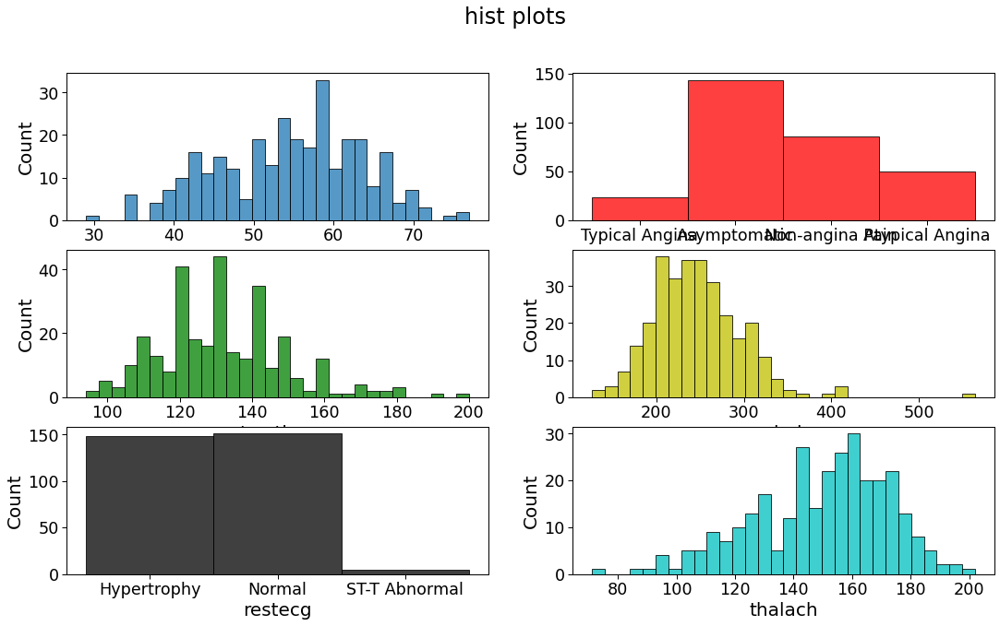

In [79]:
fig, axes = plt.subplots(3, 2, figsize=(18, 10))

fig.suptitle('hist plots')

sns.histplot(dataset['age'],ax=axes[0,0],bins=30)
sns.histplot(dataset['cp'],ax=axes[0, 1],bins=30,color='r')#drop greater than 60
sns.histplot(dataset['trestbps'],ax=axes[1, 0],bins=30,color='g')#get rid of greater than 600000
sns.histplot(dataset['chol'],ax=axes[1, 1],bins=30,color='y') # i think we should keep it/ train model and then remove it and check again
sns.histplot(dataset['restecg'],ax=axes[2, 0],bins=30,color='k') # get rid of things below 125
sns.histplot(dataset['thalach'],ax=axes[2, 1],bins=30,color='c') # drop greater than 3000

In [80]:
for column in dataset.columns:
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=dataset[column],marker_color="#ccffff",opacity=0.8))
    fig.update_layout(
        width=700,height=450, 
        title_text=column,
        yaxis_title_text='count',
        bargap=0.05,
        template = 'plotly_dark')
    fig.show()
    if column != "target":
        fig = px.violin(dataset, y=column, x="target",box=True, points="all",hover_data=dataset.columns)
        fig.update_layout(
        width=700,height=450, 
        title_text=column,
        yaxis_title_text='distribution',
        template = 'plotly_dark')
        fig.show()

# Preprocessing

## Fill N/A Value

In [67]:
dataset = pd.read_csv("processed.cleveland.csv", na_values=['?'])
dataset['target'] = dataset.target.map({0: 0, 1: 1, 2: 1, 3: 1, 4:1})

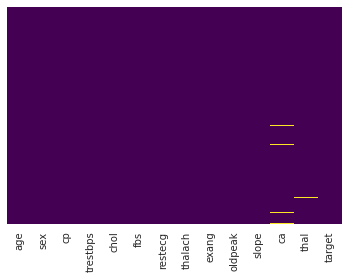

In [68]:
sns.heatmap(dataset.isnull(),yticklabels=False,cbar=False,cmap='viridis')
#  'viridis', 'plasma', 'inferno', 'magma', 'cividis'

In [69]:
dataset.dropna(axis=0, how='any', inplace=True)

In [70]:
dataset['thal'] = dataset.thal.fillna(dataset.thal.mean())
dataset['ca'] = dataset.ca.fillna(dataset.ca.mean())

In [71]:
dataset.isnull().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64

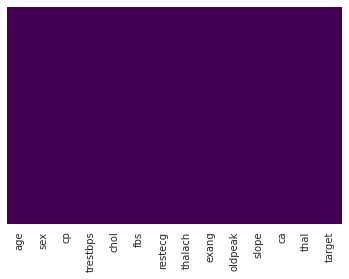

In [72]:
sns.heatmap(dataset.isnull(),yticklabels=False,cbar=False,cmap='viridis')

## Outliers

In [73]:
from collections import Counter

def detect_outliers(df,features):
    outlier_indices = []
    
    for c in features:
        # 1st quartile
        Q1 = np.percentile(df[c],25)
        # 3rd quartile
        Q3 = np.percentile(df[c],75)
        # IQR
        IQR = Q3 - Q1
        # Outlier step
        outlier_step = IQR * 1.5
        # detect outlier and their indeces
        outlier_list_col = df[(df[c] < Q1 - outlier_step) | (df[c] > Q3 + outlier_step)].index
        # store indeces
        outlier_indices.extend(outlier_list_col)
    
    outlier_indices = Counter(outlier_indices)
    multiple_outliers = list(i for i, v in outlier_indices.items() if v > 2)
    
    return multiple_outliers

In [74]:
dataset.loc[detect_outliers(dataset,dataset.columns)]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
183,59.0,1.0,1.0,178.0,270.0,0.0,2.0,145.0,0.0,4.2,3.0,0.0,7.0,0


In [75]:
from sklearn.preprocessing import StandardScaler
#Standard scaler features of the dataset
col_names = list(dataset.columns)
s_scaler = StandardScaler()
X_df= s_scaler.fit_transform(dataset)
X_df = pd.DataFrame(X_df, columns=col_names)   
X_df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,297.0,-1.237319e-16,1.001688,-2.827176,-0.724124,0.161372,0.714807,2.485798
sex,297.0,1.495250e-17,1.001688,-1.446980,-1.446980,0.691095,0.691095,0.691095
cp,297.0,0.000000e+00,1.001688,-2.240629,-0.164289,-0.164289,0.873880,0.873880
trestbps,297.0,4.810966e-16,1.001688,-2.125634,-0.659431,-0.095506,0.468418,3.851964
chol,297.0,-1.911116e-16,1.001688,-2.337704,-0.700254,-0.083802,0.551914,6.099981
fbs,297.0,-2.347542e-16,1.001688,-0.411450,-0.411450,-0.411450,-0.411450,2.430427
restecg,297.0,2.945642e-16,1.001688,-1.003419,-1.003419,0.003390,1.010199,1.010199
thalach,297.0,5.143660e-16,1.001688,-3.431849,-0.724769,0.148482,0.716096,2.287949
exang,297.0,-7.700537e-17,1.001688,-0.696419,-0.696419,-0.696419,1.435916,1.435916
oldpeak,297.0,-1.334511e-16,1.001688,-0.906712,-0.906712,-0.219520,0.467672,4.419026


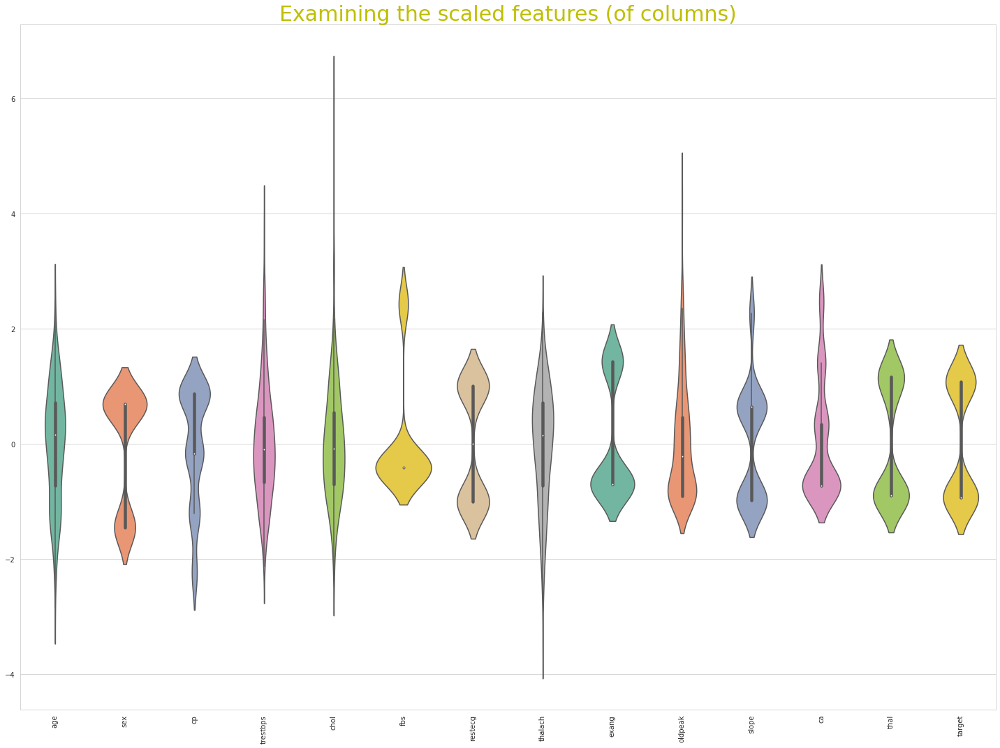

In [76]:
#Examining the scaled features
sns.set_style("whitegrid")

plt.figure(figsize=(20,15))
plt.title('Examining the scaled features (of columns)', color="y",fontsize=30)
#colours =["#774571","#b398af","#f1f1f1" ,"#afcdc7", "#6daa9f"]
sns.violinplot(data = X_df,palette = 'Set2')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Build Modle

In [77]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.decomposition import PCA

from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier

from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance
from sklearn.preprocessing import MinMaxScaler

from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import classification_report, precision_recall_curve, plot_confusion_matrix
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.model_selection import KFold

from sklearn.feature_selection import RFE

import warnings
warnings.filterwarnings("ignore")

In [79]:
X = dataset.drop('target', axis=1)
y = dataset['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=3)

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# X_valid, X_test, y_valid, y_test = train_test_split(X_test, y_test, test_size=20, random_state=42)

# Model Testing


GaussianNB

Train score of trained model: 84.38818565400844
Test score of trained model: 85.0
 
Accuracy : 0.85
Precision: 0.8275862068965517
Recall   : 0.8571428571428571
F1 score : 0.8421052631578947
Specificity : 0.84375

Classification Report: 
              precision    recall  f1-score   support

           0       0.87      0.84      0.86        32
           1       0.83      0.86      0.84        28

    accuracy                           0.85        60
   macro avg       0.85      0.85      0.85        60
weighted avg       0.85      0.85      0.85        60





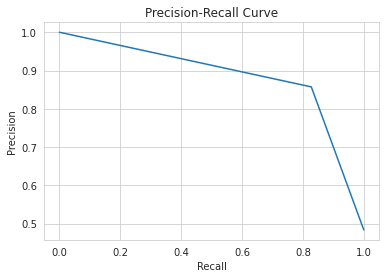

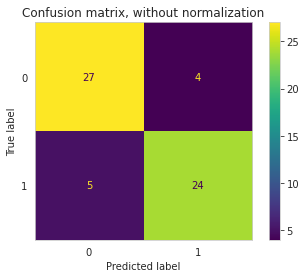

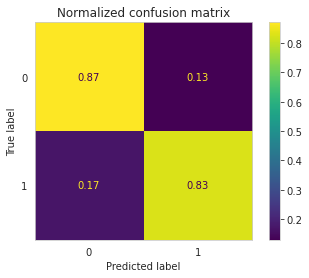

############################################################################




BernoulliNB

Train score of trained model: 83.54430379746836
Test score of trained model: 88.33333333333333
 
Accuracy : 0.8833333333333333
Precision: 0.8620689655172413
Recall   : 0.8928571428571429
F1 score : 0.8771929824561403
Specificity : 0.875

Classification Report: 
              precision    recall  f1-score   support

           0       0.90      0.88      0.89        32
           1       0.86      0.89      0.88        28

    accuracy                           0.88        60
   macro avg       0.88      0.88      0.88        60
weighted avg       0.88      0.88      0.88        60





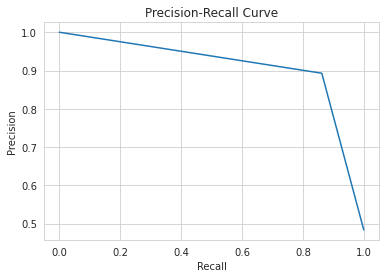

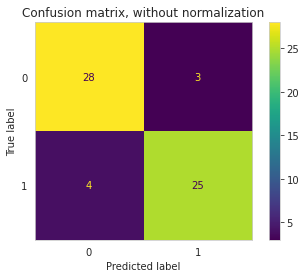

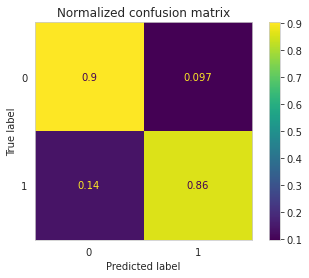

############################################################################




LinearDiscriminantAnalysis

Train score of trained model: 84.38818565400844
Test score of trained model: 83.33333333333334
 
Accuracy : 0.8333333333333334
Precision: 0.8275862068965517
Recall   : 0.8275862068965517
F1 score : 0.8275862068965517
Specificity : 0.8387096774193549

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.84      0.84        31
           1       0.83      0.83      0.83        29

    accuracy                           0.83        60
   macro avg       0.83      0.83      0.83        60
weighted avg       0.83      0.83      0.83        60





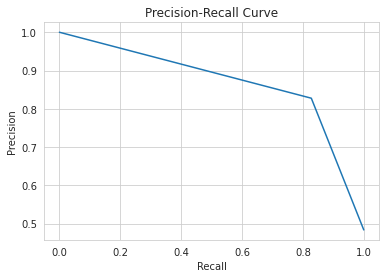

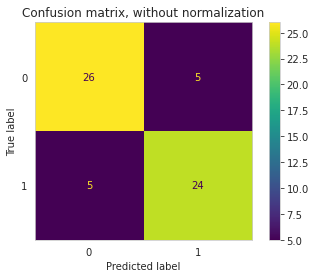

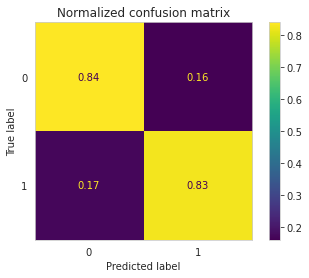

############################################################################




LogisticRegression

Train score of trained model: 85.65400843881856
Test score of trained model: 83.33333333333334
 
Accuracy : 0.8333333333333334
Precision: 0.8275862068965517
Recall   : 0.8275862068965517
F1 score : 0.8275862068965517
Specificity : 0.8387096774193549

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.84      0.84        31
           1       0.83      0.83      0.83        29

    accuracy                           0.83        60
   macro avg       0.83      0.83      0.83        60
weighted avg       0.83      0.83      0.83        60





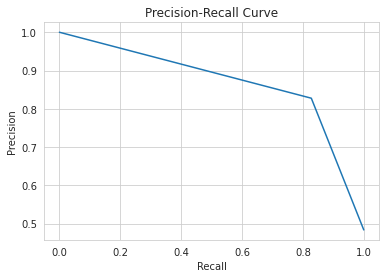

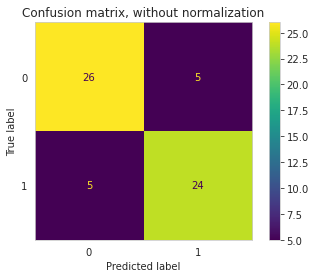

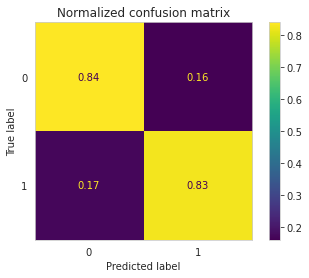

############################################################################




RandomForestClassifier

Train score of trained model: 100.0
Test score of trained model: 80.0
 
Accuracy : 0.8
Precision: 0.7586206896551724
Recall   : 0.8148148148148148
F1 score : 0.7857142857142857
Specificity : 0.7878787878787878

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.79      0.81        33
           1       0.76      0.81      0.79        27

    accuracy                           0.80        60
   macro avg       0.80      0.80      0.80        60
weighted avg       0.80      0.80      0.80        60





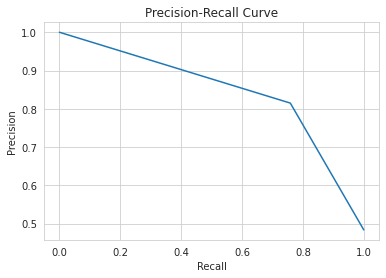

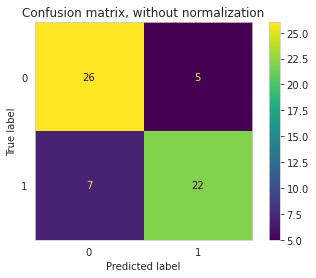

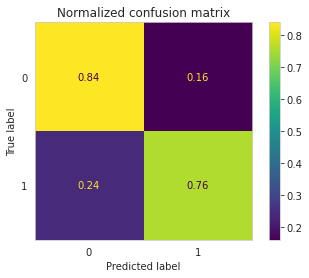

############################################################################




SupportVectorMachine

Train score of trained model: 91.13924050632912
Test score of trained model: 86.66666666666667
 
Accuracy : 0.8666666666666667
Precision: 0.7931034482758621
Recall   : 0.92
F1 score : 0.851851851851852
Specificity : 0.8285714285714286

Classification Report: 
              precision    recall  f1-score   support

           0       0.94      0.83      0.88        35
           1       0.79      0.92      0.85        25

    accuracy                           0.87        60
   macro avg       0.86      0.87      0.87        60
weighted avg       0.88      0.87      0.87        60





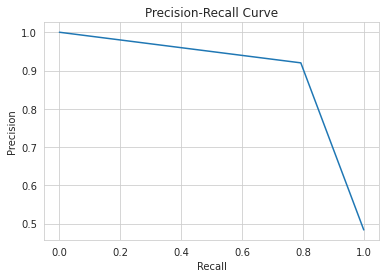

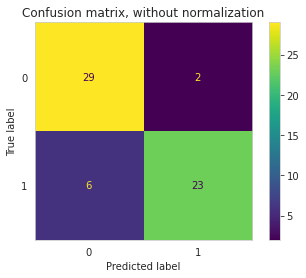

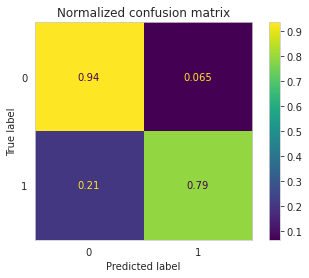

############################################################################




DecisionTreeClassifier

Train score of trained model: 100.0
Test score of trained model: 80.0
 
Accuracy : 0.8
Precision: 0.7931034482758621
Recall   : 0.7931034482758621
F1 score : 0.7931034482758621
Specificity : 0.8064516129032258

Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.81      0.81        31
           1       0.79      0.79      0.79        29

    accuracy                           0.80        60
   macro avg       0.80      0.80      0.80        60
weighted avg       0.80      0.80      0.80        60





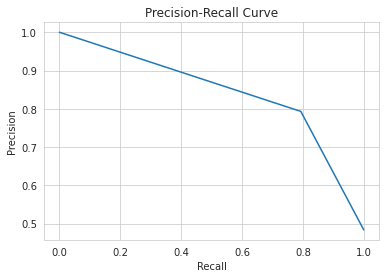

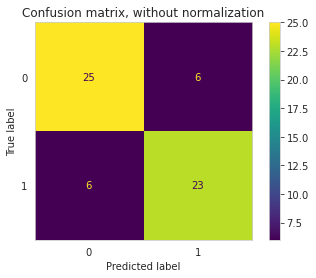

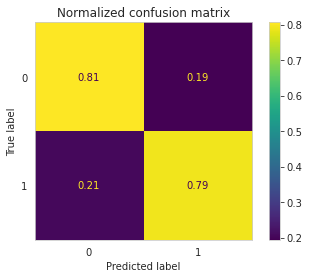

############################################################################




KNeighborsClassifier

Train score of trained model: 86.49789029535864
Test score of trained model: 86.66666666666667
 
Accuracy : 0.8666666666666667
Precision: 0.8275862068965517
Recall   : 0.8888888888888888
F1 score : 0.8571428571428572
Specificity : 0.8484848484848485

Classification Report: 
              precision    recall  f1-score   support

           0       0.90      0.85      0.88        33
           1       0.83      0.89      0.86        27

    accuracy                           0.87        60
   macro avg       0.87      0.87      0.87        60
weighted avg       0.87      0.87      0.87        60





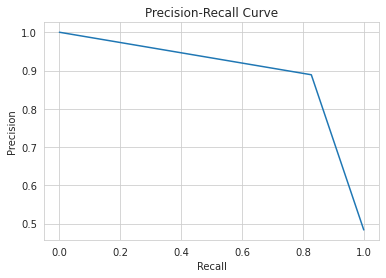

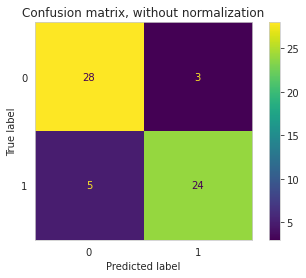

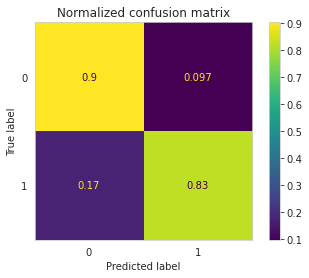

############################################################################




GradientBoostingClassifier

Train score of trained model: 99.57805907172997
Test score of trained model: 85.0
 
Accuracy : 0.85
Precision: 0.8620689655172413
Recall   : 0.8333333333333334
F1 score : 0.847457627118644
Specificity : 0.8666666666666667

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.87      0.85        30
           1       0.86      0.83      0.85        30

    accuracy                           0.85        60
   macro avg       0.85      0.85      0.85        60
weighted avg       0.85      0.85      0.85        60





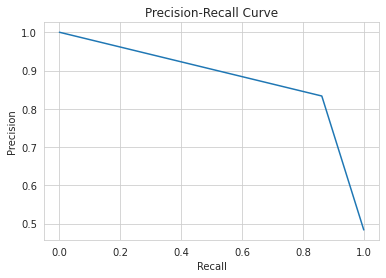

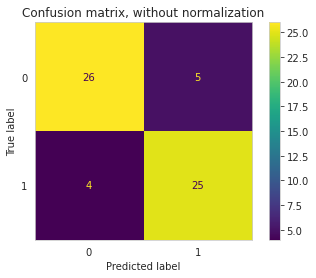

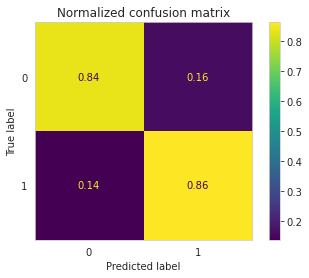

############################################################################




AdaBoostClassifier

Train score of trained model: 94.09282700421942
Test score of trained model: 76.66666666666667
 
Accuracy : 0.7666666666666667
Precision: 0.7241379310344828
Recall   : 0.7777777777777778
F1 score : 0.75
Specificity : 0.7575757575757576

Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.76      0.78        33
           1       0.72      0.78      0.75        27

    accuracy                           0.77        60
   macro avg       0.77      0.77      0.77        60
weighted avg       0.77      0.77      0.77        60





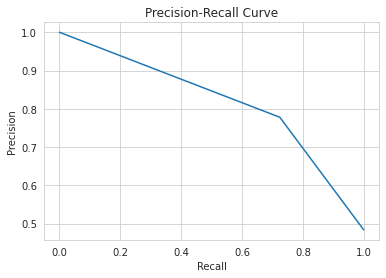

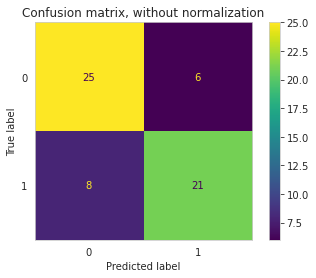

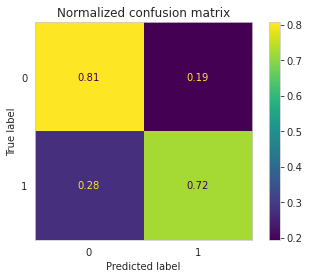

############################################################################




BaggingClassifier

Train score of trained model: 98.31223628691983
Test score of trained model: 80.0
 
Accuracy : 0.8
Precision: 0.7241379310344828
Recall   : 0.84
F1 score : 0.7777777777777777
Specificity : 0.7714285714285715

Classification Report: 
              precision    recall  f1-score   support

           0       0.87      0.77      0.82        35
           1       0.72      0.84      0.78        25

    accuracy                           0.80        60
   macro avg       0.80      0.81      0.80        60
weighted avg       0.81      0.80      0.80        60





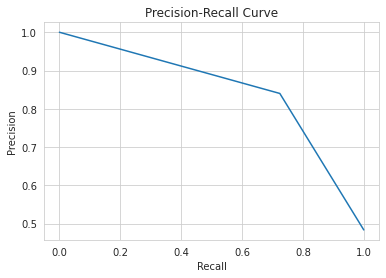

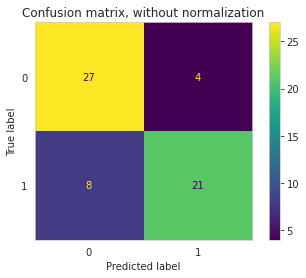

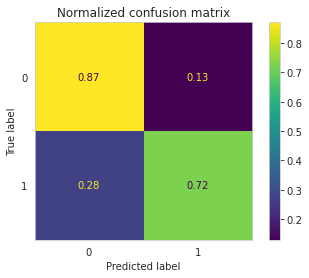

############################################################################




ExtraTreesClassifier

Train score of trained model: 100.0
Test score of trained model: 81.66666666666667
 
Accuracy : 0.8166666666666667
Precision: 0.7931034482758621
Recall   : 0.8214285714285714
F1 score : 0.8070175438596492
Specificity : 0.8125

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.81      0.83        32
           1       0.79      0.82      0.81        28

    accuracy                           0.82        60
   macro avg       0.82      0.82      0.82        60
weighted avg       0.82      0.82      0.82        60





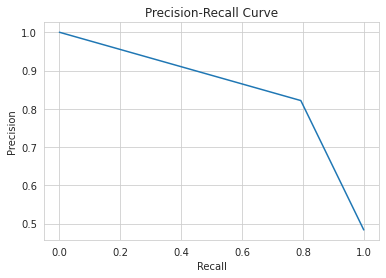

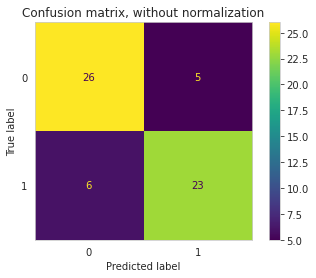

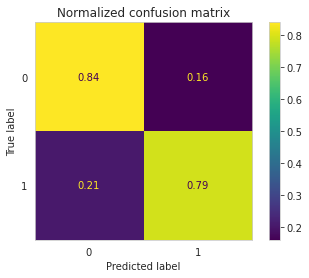

############################################################################



[23:07:01] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

XGBClassifier

Train score of trained model: 100.0
Test score of trained model: 88.33333333333333
 
Accuracy : 0.8833333333333333
Precision: 0.8620689655172413
Recall   : 0.8928571428571429
F1 score : 0.8771929824561403
Specificity : 0.875

Classification Report: 
              precision    recall  f1-score   support

           0       0.90      0.88      0.89        32
           1       0.86      0.89      0.88        28

    accuracy                           0.88        60
   macro avg       0.88      0.88      0.88        60
weighted avg       0.88      0.88      0.88        60





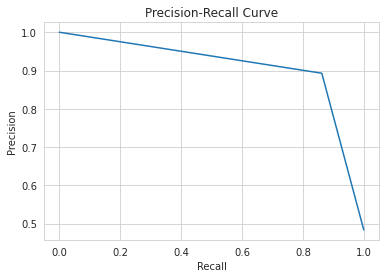

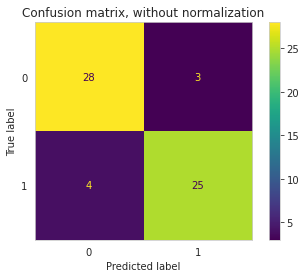

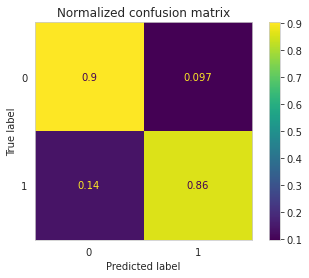

############################################################################




Stochastic Gradient Descent

Train score of trained model: 81.0126582278481
Test score of trained model: 73.33333333333333
 
Accuracy : 0.7333333333333333
Precision: 0.7931034482758621
Recall   : 0.696969696969697
F1 score : 0.7419354838709677
Specificity : 0.7777777777777778

Classification Report: 
              precision    recall  f1-score   support

           0       0.68      0.78      0.72        27
           1       0.79      0.70      0.74        33

    accuracy                           0.73        60
   macro avg       0.74      0.74      0.73        60
weighted avg       0.74      0.73      0.73        60





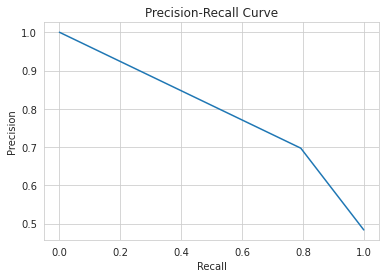

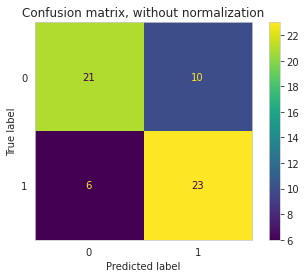

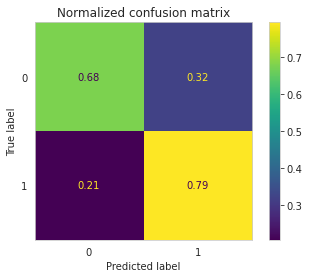

############################################################################




Neural Nets

Train score of trained model: 100.0
Test score of trained model: 81.66666666666667
 
Accuracy : 0.8166666666666667
Precision: 0.8620689655172413
Recall   : 0.78125
F1 score : 0.8196721311475409
Specificity : 0.8571428571428571

Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.86      0.81        28
           1       0.86      0.78      0.82        32

    accuracy                           0.82        60
   macro avg       0.82      0.82      0.82        60
weighted avg       0.82      0.82      0.82        60





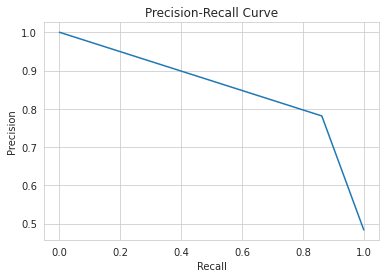

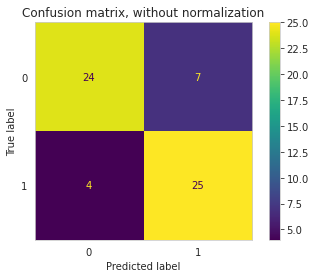

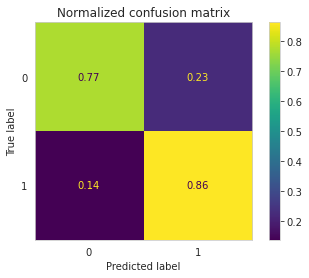

############################################################################





In [80]:
models = {
    'GaussianNB': GaussianNB(),
    'BernoulliNB': BernoulliNB(),
    'LinearDiscriminantAnalysis':LinearDiscriminantAnalysis(),
    'LogisticRegression': LogisticRegression(),
    'RandomForestClassifier': RandomForestClassifier(),
    'SupportVectorMachine': SVC(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'KNeighborsClassifier': KNeighborsClassifier(),
    'GradientBoostingClassifier': GradientBoostingClassifier(),
    'AdaBoostClassifier': AdaBoostClassifier(),
    'BaggingClassifier': BaggingClassifier(),
    'ExtraTreesClassifier': ExtraTreesClassifier(),
    'XGBClassifier': XGBClassifier(learning_rate= 1, max_depth= 5, n_estimators= 10),
    'Stochastic Gradient Descent':  SGDClassifier(max_iter=5000, random_state=0),
    'Neural Nets': MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1),
}

modelNames = ["GaussianNB", 'BernoulliNB', 'LinearDiscriminantAnalysis','LogisticRegression','RandomForestClassifier','SupportVectorMachine',
             'DecisionTreeClassifier', 'KNeighborsClassifier','GradientBoostingClassifier', 'AdaBoostClassifier', 'BaggingClassifier','XGBClassifier',
              'ExtraTreesClassifier',
             'Stochastic Gradient Descent', 'Neural Nets']

trainScores = []
validationScores = []
testScores = []

for m in models:
    model = models[m]
    model.fit(X_train, y_train, )
#     score = model.score(X_valid, y_valid)

    print(f'\n{m}\n') 
    train_score = model.score(X_train, y_train)
    print(f'Train score of trained model: {train_score*100}')
    trainScores.append(train_score*100)

#     validation_score = model.score(X_valid, y_valid)
#     print(f'Validation score of trained model: {validation_score*100}')
#     validationScores.append(validation_score*100)

    test_score = model.score(X_test, y_test)
    print(f'Test score of trained model: {test_score*100}')
    testScores.append(test_score*100)
    print(" ")

    y_predictions = model.predict(X_test)
    cm = confusion_matrix(y_predictions, y_test)

    tn = cm[0,0]
    fp = cm[0,1]
    tp = cm[1,1]
    fn = cm[1,0]
    accuracy  = (tp + tn) / (tp + fp + tn + fn)
    precision = tp / (tp + fp)
    recall    = tp / (tp + fn)
    f1score  = 2 * precision * recall / (precision + recall)
    specificity = tn / (tn + fp)
    print(f'Accuracy : {accuracy}')
    print(f'Precision: {precision}')
    print(f'Recall   : {recall}')
    print(f'F1 score : {f1score}')
    print(f'Specificity : {specificity}')
    print("") 
    print(f'Classification Report: \n{classification_report(y_predictions, y_test)}\n')
    print("")
    
    precision, recall, thresholds = precision_recall_curve(y_test, y_predictions)
    plt.plot(recall, precision)
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    
    # Plot non-normalized confusion matrix
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(model, X_test, y_test,
                                 normalize=normalize)
        plt.grid(False)
        disp.ax_.set_title(title)
    
    plt.show()

    for m in range (1):
        current = modelNames[m]
        modelNames.remove(modelNames[m])

    preds = model.predict(X_test)
    confusion_matr = confusion_matrix(y_test, preds) #normalize = 'true'
    print("############################################################################")
    print("")
    print("")
    print("")

### Check the accuracy from each model

In [81]:
modelNames = ["GaussianNB", 'BernoulliNB', 'LinearDiscriminantAnalysis','LogisticRegression','RandomForestClassifier','SupportVectorMachine',
             'DecisionTreeClassifier', 'KNeighborsClassifier','GradientBoostingClassifier', 'AdaBoostClassifier', 'BaggingClassifier','XGBClassifier',
              'ExtraTreesClassifier',
             'Stochastic Gradient Descent', 'Neural Nets']

for i in range(len(modelNames)):
    print(f'Accuracy of {modelNames[i]} -----> {testScores[i]}')

Accuracy of GaussianNB -----> 85.0
Accuracy of BernoulliNB -----> 88.33333333333333
Accuracy of LinearDiscriminantAnalysis -----> 83.33333333333334
Accuracy of LogisticRegression -----> 83.33333333333334
Accuracy of RandomForestClassifier -----> 80.0
Accuracy of SupportVectorMachine -----> 86.66666666666667
Accuracy of DecisionTreeClassifier -----> 80.0
Accuracy of KNeighborsClassifier -----> 86.66666666666667
Accuracy of GradientBoostingClassifier -----> 85.0
Accuracy of AdaBoostClassifier -----> 76.66666666666667
Accuracy of BaggingClassifier -----> 80.0
Accuracy of XGBClassifier -----> 81.66666666666667
Accuracy of ExtraTreesClassifier -----> 88.33333333333333
Accuracy of Stochastic Gradient Descent -----> 73.33333333333333
Accuracy of Neural Nets -----> 81.66666666666667


In [82]:
# function to add value labels
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, y[i], round(y[i], 3), ha = 'center',
                 Bbox = dict(facecolor = 'gold', alpha =.9), weight='bold')

No handles with labels found to put in legend.


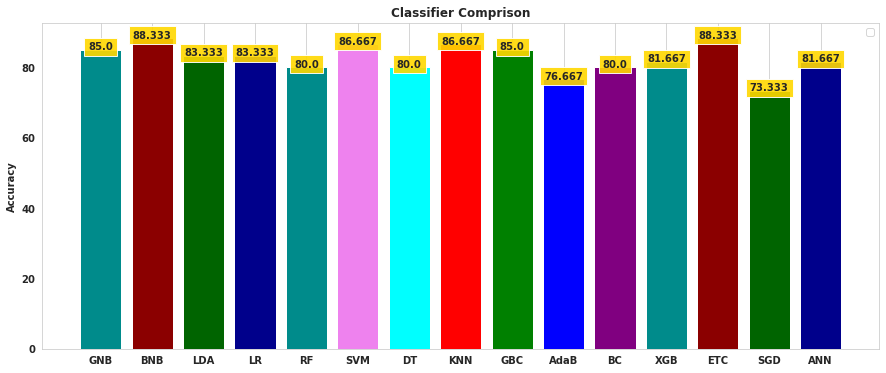

In [83]:
Names = ["GNB", 'BNB', 'LDA','LR','RF','SVM',
             'DT', 'KNN','GBC', 'AdaB', 'BC','XGB',
              'ETC', 'SGD', 'ANN']
fig = plt.figure(figsize=(15,6))
plt.title("Classifier Comprison",fontweight='bold')
plt.ylabel("Accuracy", fontweight="bold")
plt.xticks(weight="bold")
plt.yticks(weight="bold")
plt.bar(Names, testScores, color=['darkcyan', 'darkred', 'darkgreen', 'darkblue', 'darkcyan', 'violet', 'cyan', 'red', 'green', 'blue', 'purple'])

plt.grid(axis='y')
addlabels(Names, testScores)
plt.legend()

## Gradient Boosting Parameter Tunning

In [84]:
# Fine tunong
model = GradientBoostingClassifier()
n_estimators = [10, 100, 1000]
learning_rate = [0.001, 0.01, 0.1]
subsample = [0.5, 0.7, 1.0]
max_depth = [3, 7, 9]

# define grid search
grid = dict(learning_rate=learning_rate, n_estimators=n_estimators,
            subsample=subsample, max_depth=max_depth)
kfold = KFold(n_splits=10, random_state=0)
cv_results = cross_val_score(
    model, X_train, y_train, cv=10, scoring='accuracy')
grid_search = GridSearchCV(estimator=model, param_grid=grid,
                           n_jobs=-1, cv=10, scoring='accuracy', error_score=0)
grid_result = grid_search.fit(X_train, y_train)

# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.826449 using {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.5}
0.544384 (0.011969) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 0.5}
0.544384 (0.011969) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 0.7}
0.544384 (0.011969) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 1.0}
0.611957 (0.034684) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
0.641486 (0.050037) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}
0.725362 (0.059132) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
0.826449 (0.056988) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.5}
0.822101 (0.064151) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.7}
0.804891 (0.090409) with: {'learning_rate': 0.001, 

In [85]:
def classification_metrics(model, conf_matrix):
    print(
        f"Training Accuracy Score: {model.score(X_train, y_train) * 100:.1f}%")
    print(
        f"Validation Accuracy Score: {model.score(X_test, y_test) * 100:.1f}%")
    fig, ax = plt.subplots(figsize=(8, 6))
    sns.heatmap(pd.DataFrame(conf_matrix), annot=True, cmap='YlGnBu', fmt='g')
    ax.xaxis.set_label_position('top')
    plt.tight_layout()
    plt.title('Confusion Matrix', fontsize=20, y=1.1)
    plt.ylabel('Actual label', fontsize=15)
    plt.xlabel('Predicted label', fontsize=15)
    plt.show()
    print(classification_report(y_test, y_pred))


In [86]:
from sklearn.metrics import roc_auc_score

Training Accuracy Score: 100.0%
Validation Accuracy Score: 85.0%


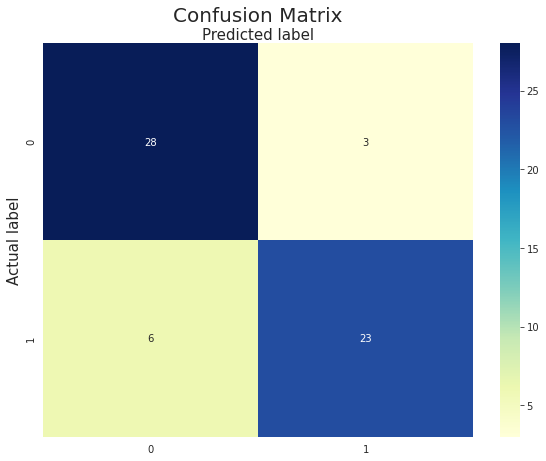

              precision    recall  f1-score   support

           0       0.82      0.90      0.86        31
           1       0.88      0.79      0.84        29

    accuracy                           0.85        60
   macro avg       0.85      0.85      0.85        60
weighted avg       0.85      0.85      0.85        60



0.8481646273637374

In [88]:
# Predict unseen data
pipeline = make_pipeline(MinMaxScaler(),  GradientBoostingClassifier(
    learning_rate=0.1, max_depth=9, n_estimators=1000, subsample=0.5))
model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_metrics(pipeline, conf_matrix)
roc_auc_score(y_test, y_pred)

# Take a look of model with highest score

In [39]:
rf = RandomForestClassifier(n_estimators=500, )
rf.fit(X_train, y_train)

train_score = rf.score(X_train, y_train)
print("Train Score of trained model :", train_score)

test_score = rf.score(X_test, y_test)
print("Test Score of trained model :", test_score)

y_predictions = rf.predict(X_test)

conf_matrix = confusion_matrix(y_predictions, y_test)


print(f'Accuracy: {accuracy_score(y_predictions, y_test)*100}')
print()
print(f'Confussion matrix: \n{conf_matrix}\n')

Train Score of trained model : 1.0
Test Score of trained model : 0.875
Accuracy: 87.5

Confussion matrix: 
[[51  8]
 [ 5 40]]



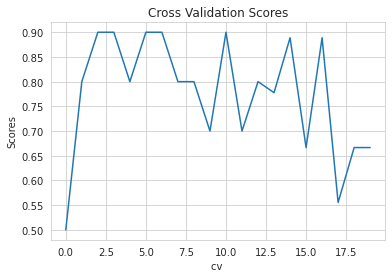

In [40]:
g = cross_val_score(rf, X = X_train, y = y_train, cv =  20)
plt.title("Cross Validation Scores")
plt.xlabel("cv ")
plt.ylabel("Scores")
plt.plot(g)

In [41]:
mean_accuracy = np.average(g)
std = np.std(g)
print(f"Average Accuracy: {mean_accuracy} and Standard Deviation: {std}")

Average Accuracy: 0.7755555555555556 and Standard Deviation: 0.1177777777777778


# Models

In [19]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, precision_recall_curve, auc

In [20]:
def train(clf, X_train, y_train):
    clf.fit(X_train, y_train)
    return clf 

In [26]:
def test(model_name, clf, X_train, y_train, X_test, y_test):
    y_pred = clf.predict(X_test)
    y_pred_train = classifier.predict(X_train)
    
    cm_test = confusion_matrix(y_pred, y_test)
    
    print(f'Accuracy for training set for {model_name} = {accuracy_score(y_train, y_pred_train)}\n')
    print(f'Accuracy for test set for {model_name} = {accuracy_score(y_test, y_pred)}')
    print(f'Precision for test set for {model_name} = {precision_score(y_test, y_pred)}')
    print(f'Recall for test set for {model_name} = {recall_score(y_test, y_pred)}')
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred)
    plt.plot(recall, precision)
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    plt.grid(False)
#     plt.plot(auc(y_test, y_pred))
    
    # Plot non-normalized confusion matrix
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
        plt.grid(False)
        disp.ax_.set_title(title)

        print(title)
        print(disp.confusion_matrix)

## SVM (Support Vector Machine)

Accuracy for training set for SVM = 0.8963730569948186

Accuracy for test set for SVM = 0.8653846153846154
Precision for test set for SVM = 0.8695652173913043
Recall for test set for SVM = 0.8333333333333334
Confusion matrix, without normalization
[[50  6]
 [ 8 40]]
Normalized confusion matrix
[[0.89285714 0.10714286]
 [0.16666667 0.83333333]]


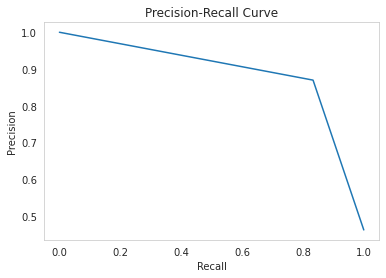

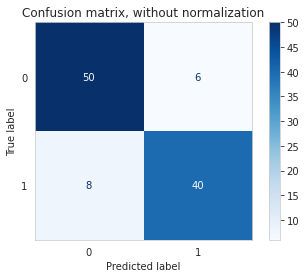

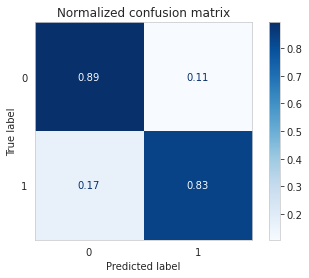

In [27]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'rbf')
classifier = train(classifier, X_train, y_train)
test("SVM", classifier, X_train, y_train, X_test, y_test)

# Naive Bayes Classifier

Accuracy for training set for Naive Bayes = 0.844559585492228

Accuracy for test set for Naive Bayes = 0.8557692307692307
Precision for test set for Naive Bayes = 0.8235294117647058
Recall for test set for Naive Bayes = 0.875
Confusion matrix, without normalization
[[47  9]
 [ 6 42]]
Normalized confusion matrix
[[0.83928571 0.16071429]
 [0.125      0.875     ]]


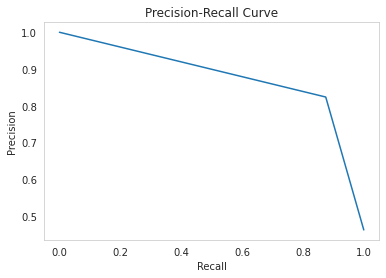

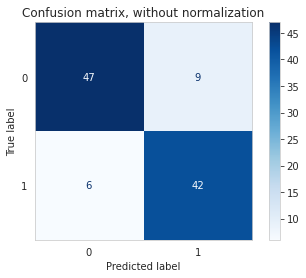

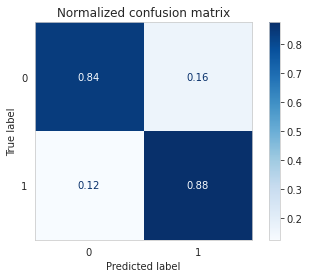

In [28]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier = train(classifier, X_train, y_train)
test("Naive Bayes", classifier, X_train, y_train, X_test, y_test)

## Logistic Regression 

Accuracy for training set for Logistic Regression = 0.8497409326424871

Accuracy for test set for Logistic Regression = 0.8461538461538461
Precision for test set for Logistic Regression = 0.82
Recall for test set for Logistic Regression = 0.8541666666666666
Confusion matrix, without normalization
[[47  9]
 [ 7 41]]
Normalized confusion matrix
[[0.83928571 0.16071429]
 [0.14583333 0.85416667]]


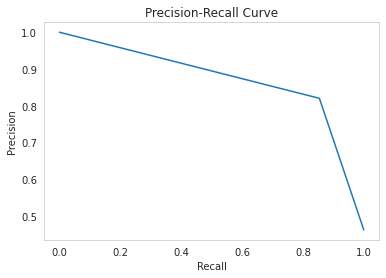

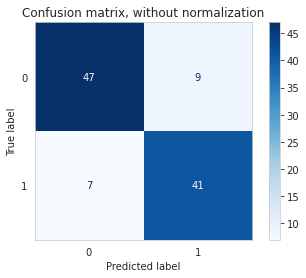

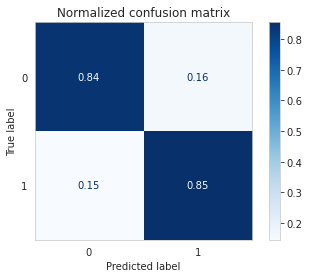

In [29]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression()
classifier = train(classifier, X_train, y_train)
test("Logistic Regression", classifier, X_train, y_train, X_test, y_test)

## Decision Tree

Accuracy for training set for Decision Tree = 1.0

Accuracy for test set for Decision Tree = 0.7692307692307693
Precision for test set for Decision Tree = 0.7857142857142857
Recall for test set for Decision Tree = 0.6875
Confusion matrix, without normalization
[[47  9]
 [15 33]]
Normalized confusion matrix
[[0.83928571 0.16071429]
 [0.3125     0.6875    ]]


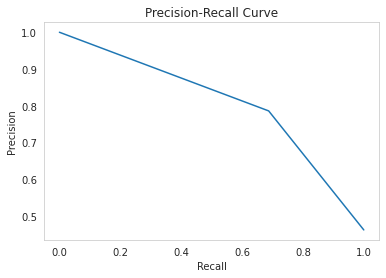

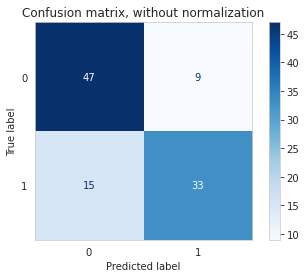

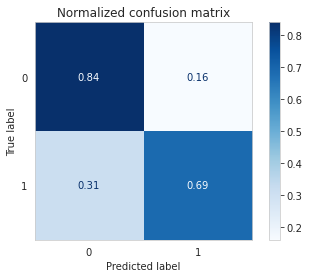

In [30]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier()
classifier = train(classifier, X_train, y_train)
test("Decision Tree", classifier, X_train, y_train, X_test, y_test)

## Random Forest

Accuracy for training set for Random Forest = 1.0

Accuracy for test set for Random Forest = 0.875
Precision for test set for Random Forest = 0.8888888888888888
Recall for test set for Random Forest = 0.8333333333333334
Confusion matrix, without normalization
[[51  5]
 [ 8 40]]
Normalized confusion matrix
[[0.91071429 0.08928571]
 [0.16666667 0.83333333]]


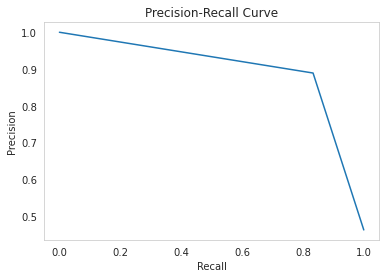

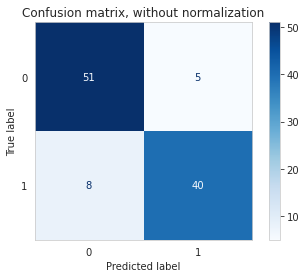

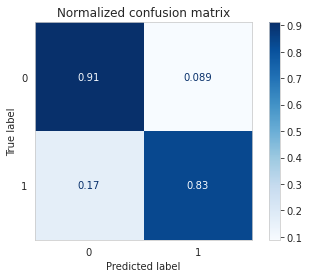

In [31]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 700)
classifier = train(classifier, X_train, y_train)
test("Random Forest", classifier, X_train, y_train, X_test, y_test)

## K Nearest Neighbors

Accuracy for training set for K Nearest Neighbors = 1.0

Accuracy for test set for K Nearest Neighbors = 0.7788461538461539
Precision for test set for K Nearest Neighbors = 0.7551020408163265
Recall for test set for K Nearest Neighbors = 0.7708333333333334
Confusion matrix, without normalization
[[44 12]
 [11 37]]
Normalized confusion matrix
[[0.78571429 0.21428571]
 [0.22916667 0.77083333]]


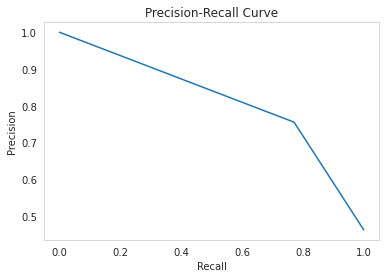

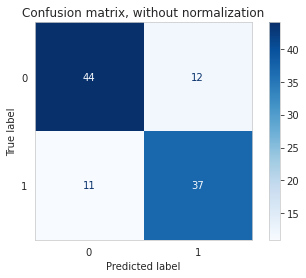

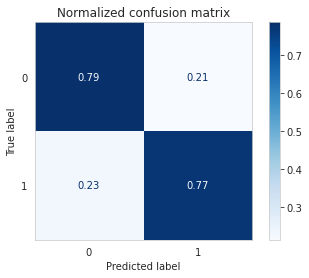

In [32]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=1)
classifier = train(classifier, X_train, y_train)
test("K Nearest Neighbors", classifier, X_train, y_train, X_test, y_test)

## ANN (Artificial Neural Networks)

Accuracy for training set for Multi Layer Perceptron = 1.0

Accuracy for test set for Multi Layer Perceptron = 0.8076923076923077
Precision for test set for Multi Layer Perceptron = 0.7916666666666666
Recall for test set for Multi Layer Perceptron = 0.7916666666666666
Confusion matrix, without normalization
[[46 10]
 [10 38]]
Normalized confusion matrix
[[0.82142857 0.17857143]
 [0.20833333 0.79166667]]


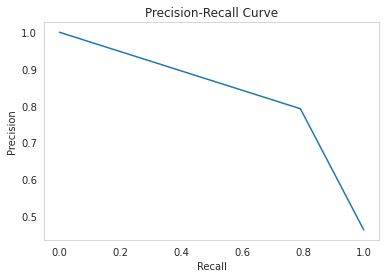

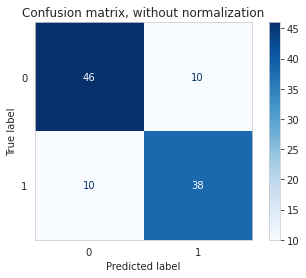

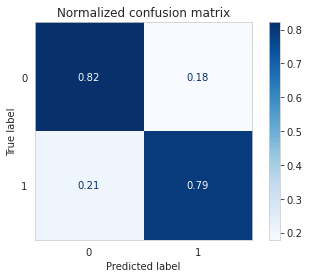

In [33]:
from sklearn.neural_network import MLPClassifier
classifier = MLPClassifier(hidden_layer_sizes=5000)
classifier = train(classifier, X_train, y_train)
test("Multi Layer Perceptron", classifier, X_train, y_train, X_test, y_test)

## light GBM

In [34]:
    !pip install lightgbm

In [35]:
import lightgbm as lgb

d_train = lgb.Dataset(X_train, label = y_train)
params = {}

clf = lgb.train(params, d_train, 100)
#Prediction
y_pred = clf.predict(X_test)
#convert into binary values
for i in range(0, len(y_pred)):
    if y_pred[i]>= 0.5:       # setting threshold to .5
       y_pred[i]=1
    else:  
       y_pred[i]=0
       
from sklearn.metrics import confusion_matrix
cm_test = confusion_matrix(y_pred, y_test)

y_pred_train = clf.predict(X_train)

for i in range(0, len(y_pred_train)):
    if y_pred_train[i]>= 0.5:       # setting threshold to .5
       y_pred_train[i]=1
    else:  
       y_pred_train[i]=0
       
cm_train = confusion_matrix(y_pred_train, y_train)
print()
print('Accuracy for training set for LightGBM = {}'.format((cm_train[0][0] + cm_train[1][1])/len(y_train)))
print('Accuracy for test set for LightGBM = {}'.format((cm_test[0][0] + cm_test[1][1])/len(y_test)))

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 221
[LightGBM] [Info] Number of data points in the train set: 193, number of used features: 13
[LightGBM] [Info] Start training from score 0.461140
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

## XGBoost

In [36]:
!pip install xgboost

In [37]:
from xgboost import XGBClassifier
xg = XGBClassifier()
xg.fit(X_train, y_train)
y_pred = xg.predict(X_test)

from sklearn.metrics import confusion_matrix
cm_test = confusion_matrix(y_pred, y_test)

y_pred_train = xg.predict(X_train)

for i in range(0, len(y_pred_train)):
    if y_pred_train[i]>= 0.5:       # setting threshold to .5
       y_pred_train[i]=1
    else:  
       y_pred_train[i]=0
       
cm_train = confusion_matrix(y_pred_train, y_train)
print()
print('Accuracy for training set for XGBoost = {}'.format((cm_train[0][0] + cm_train[1][1])/len(y_train)))
print('Accuracy for test set for XGBoost = {}'.format((cm_test[0][0] + cm_test[1][1])/len(y_test)))


[21:09:05] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

Accuracy for training set for XGBoost = 1.0
Accuracy for test set for XGBoost = 0.8269230769230769
